In [1]:
import numpy as np
import pylab as plt
import pandas as pd
import seaborn as sns

In [2]:
import sys
sys.path.append('../data/weebit')
from weebit_loader import text_features_df, features_mask, features_y_mask,\
                           X_all, y_all, feature_names

Using TensorFlow backend.


## Features Statistics

In [3]:
text_features_df.loc[:, features_mask].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
feature_adj,3636.0,0.088694,0.033933,0.000000,0.067629,0.087379,0.108696,0.259259
feature_adverbs,3636.0,0.518306,0.284784,0.000000,0.333333,0.500000,0.666667,3.000000
feature_automated_readability_index,3636.0,5.197472,2.262818,-3.246412,3.791689,5.271061,6.694588,18.488211
feature_avgnpsize,3636.0,2.935227,0.614295,1.000000,2.555556,2.883156,3.260357,9.875000
feature_avgparsetreeheight,3636.0,5.591294,1.075038,2.000000,4.857143,5.571429,6.285714,10.333333
feature_avgppsize,3636.0,4.103977,1.059090,0.000000,3.500000,4.000000,4.623463,11.714286
feature_avgvpsize,3636.0,6.786518,1.695810,0.000000,5.736455,6.666667,7.700000,22.583333
feature_coleman_liau_index,3636.0,7.646349,2.258762,-3.258426,6.419526,7.786326,9.089035,23.336641
feature_conj,3636.0,0.114909,0.029512,0.000000,0.097087,0.115132,0.132665,0.285714
feature_flesch_kincaid_grade_level,3636.0,4.848771,1.778061,-0.572273,3.641688,4.796748,6.024435,13.340000


## Features Correlations

In [4]:
fs_corr_df = text_features_df.loc[:, features_mask].corr()

In [5]:
fs_single_corrs = (fs_corr_df.unstack()
                     .sort_values(ascending=False)
                         [len(fs_corr_df):][::2])

In [6]:
fs_single_corrs.head(10)

feature_smog_index                   feature_gunning_fog_index              0.967337
feature_automated_readability_index  feature_coleman_liau_index             0.941064
feature_lix                          feature_wiener_sachtextformel          0.930389
feature_numconstituents              feature_senlen                         0.920825
feature_gunning_fog_index            feature_flesch_kincaid_grade_level     0.919516
feature_avgparsetreeheight           feature_numconstituents                0.903634
feature_wiener_sachtextformel        feature_gunning_fog_index              0.900979
feature_flesch_kincaid_grade_level   feature_wiener_sachtextformel          0.899135
                                     feature_automated_readability_index    0.896064
feature_smog_index                   feature_wiener_sachtextformel          0.889520
dtype: float64

In [7]:
fs_single_corrs.tail(10)

feature_automated_readability_index  feature_flesch_reading_ease   -0.817733
feature_coleman_liau_index           feature_flesch_reading_ease   -0.824648
feature_gulpease_index               feature_senlen                -0.827442
feature_flesch_kincaid_grade_level   feature_gulpease_index        -0.842889
feature_lix                          feature_flesch_reading_ease   -0.857881
feature_smog_index                   feature_flesch_reading_ease   -0.859632
feature_flesch_reading_ease          feature_gunning_fog_index     -0.878081
feature_automated_readability_index  feature_gulpease_index        -0.892267
feature_flesch_kincaid_grade_level   feature_flesch_reading_ease   -0.942065
feature_wiener_sachtextformel        feature_flesch_reading_ease   -0.953382
dtype: float64

In [8]:
fs_single_corrs[(fs_single_corrs < 0.01) & (fs_single_corrs > -0.01)]

feature_numwh                  feature_avgppsize                      0.007948
feature_numnp                  feature_nouns                          0.007784
feature_whpro                  feature_avgppsize                      0.006932
feature_numprep                feature_whpro                          0.006802
feature_avgppsize              feature_interj                         0.005758
feature_interj                 feature_whpro                          0.005500
feature_numvbn                 feature_numvbp                         0.005434
feature_numnp                  feature_numvb                          0.005251
feature_num_comma              feature_nouns                          0.004836
feature_avgppsize              feature_numvb                          0.004828
feature_perpro                 feature_numpp                          0.003832
feature_wiener_sachtextformel  feature_numvb                          0.002441
feature_adj                    feature_interj       

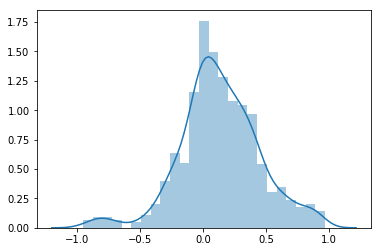

In [9]:
sns.distplot(fs_single_corrs)

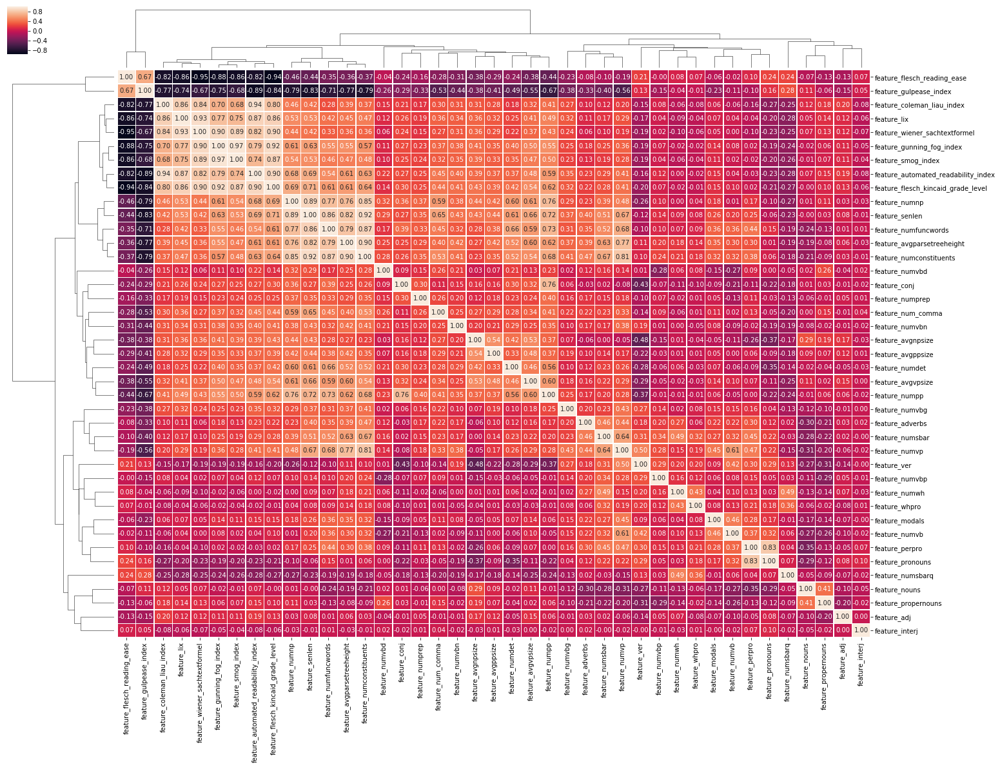

In [10]:
features_clustering = sns.clustermap(fs_corr_df, annot=True, fmt='0.2f', linewidths=.5, figsize=(24, 18))

In [11]:
ordered_features_columns = np.take(text_features_df.columns[features_mask],
                    [i for i in features_clustering.dendrogram_col.reordered_ind])
sns.pairplot(text_features_df[ordered_features_columns])

## Features Distribution by Label

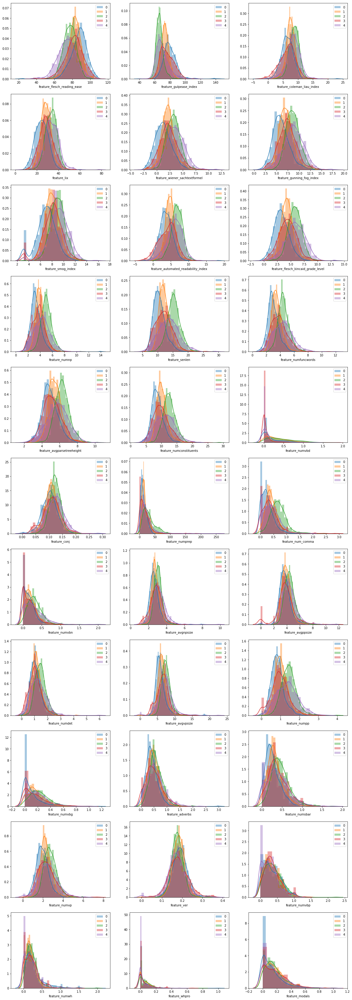

In [12]:
import itertools as it

f, axes = plt.subplots(11, 3, figsize=(20, 60))
axes = it.chain(*axes)

for feature_name, ax in zip(ordered_features_columns, axes):
    for y_value in np.sort(text_features_df['y'].unique()): 
        sns.distplot(text_features_df[text_features_df['y']==y_value][feature_name],
                     label=str(y_value), ax=ax)
    ax.legend()

## Feature Importance

### ANOVA F-value to Features

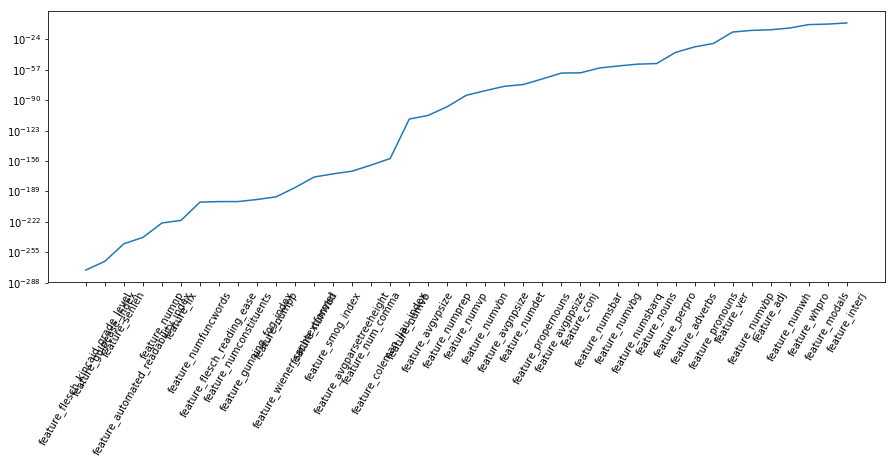

In [13]:
from sklearn.feature_selection import f_classif

_, p_values = f_classif(X_all, y_all)

features_f_classif_order = np.argsort(p_values)
p_values.sort()

f, ax = plt.subplots(figsize=(15, 5))
ax.plot(p_values)
plt.xticks(range(len(p_values)),
           (text_features_df.columns[features_mask][features_f_classif_order]),
          rotation=60)
ax.set_yscale("log")

### Extra Trees

Feature ranking:
1. feature_numvbd (0.046950)
2. feature_senlen (0.035299)
3. feature_propernouns (0.032879)
4. feature_numfuncwords (0.031891)
5. feature_flesch_kincaid_grade_level (0.031599)
6. feature_numvb (0.031172)
7. feature_nouns (0.030829)
8. feature_gulpease_index (0.030293)
9. feature_num_comma (0.030071)
10. feature_numnp (0.029390)
11. feature_automated_readability_index (0.029132)
12. feature_flesch_reading_ease (0.028418)
13. feature_numprep (0.027636)
14. feature_numconstituents (0.026824)
15. feature_numpp (0.026283)
16. feature_avgparsetreeheight (0.024494)
17. feature_coleman_liau_index (0.024482)
18. feature_avgnpsize (0.023586)
19. feature_gunning_fog_index (0.023405)
20. feature_lix (0.023382)
21. feature_wiener_sachtextformel (0.023220)
22. feature_perpro (0.022314)
23. feature_adj (0.022126)
24. feature_smog_index (0.022005)
25. feature_pronouns (0.021842)
26. feature_avgvpsize (0.021742)
27. feature_numvbp (0.020951)
28. feature_numdet (0.020608)
29. feature_nu

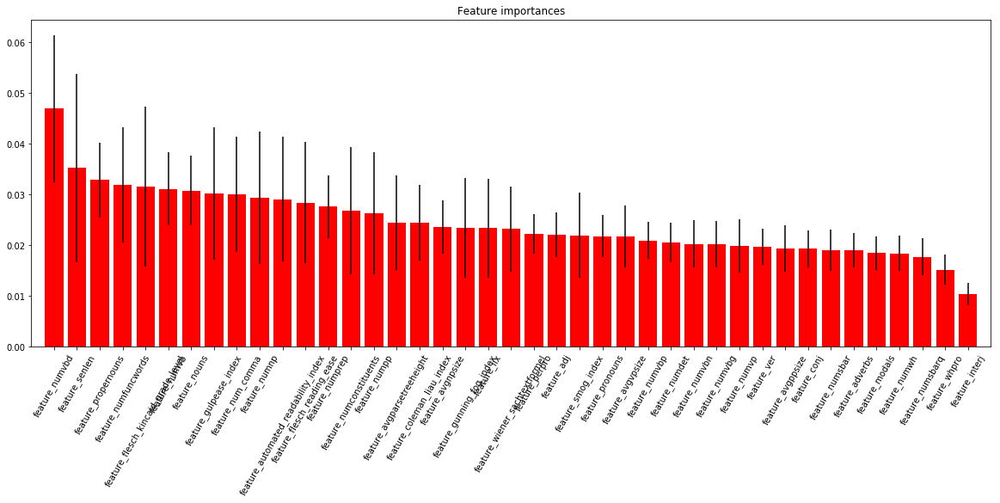

In [14]:
from sklearn.ensemble import ExtraTreesClassifier

forest_model = ExtraTreesClassifier(n_estimators=250,
                              random_state=42)
forest_model.fit(X_all, y_all)

importances = forest_model.feature_importances_

std = np.std([tree.feature_importances_ for tree in forest_model.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

ordered_feature_names = np.take(feature_names, indices
                               )
for f in range(X_all.shape[1]):
    print("%d. %s (%f)" % (f + 1, ordered_feature_names[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20, 7))
plt.title("Feature importances")
plt.bar(range(X_all.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X_all.shape[1]), ordered_feature_names, rotation=60)
plt.xlim([-1, X_all.shape[1]])
plt.show()

## Embedding Visualization

In [15]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP

def plot_embedding(embedder, X, y, title=''):
    embedding = embedder.fit_transform(X_all)
    f, ax = plt.subplots(figsize=(15, 15))
    for y_value in np.sort(y_all.unique()):
        mask = (y == y_value)
        
        ax.scatter(embedding[mask, 0], embedding[mask, 1],
                c=sns.color_palette()[y_value], label=y_value, s=8)

    f.gca().set_aspect('equal', 'datalim')
    plt.legend()
    plt.title(embedder.__class__.__name__ + title)

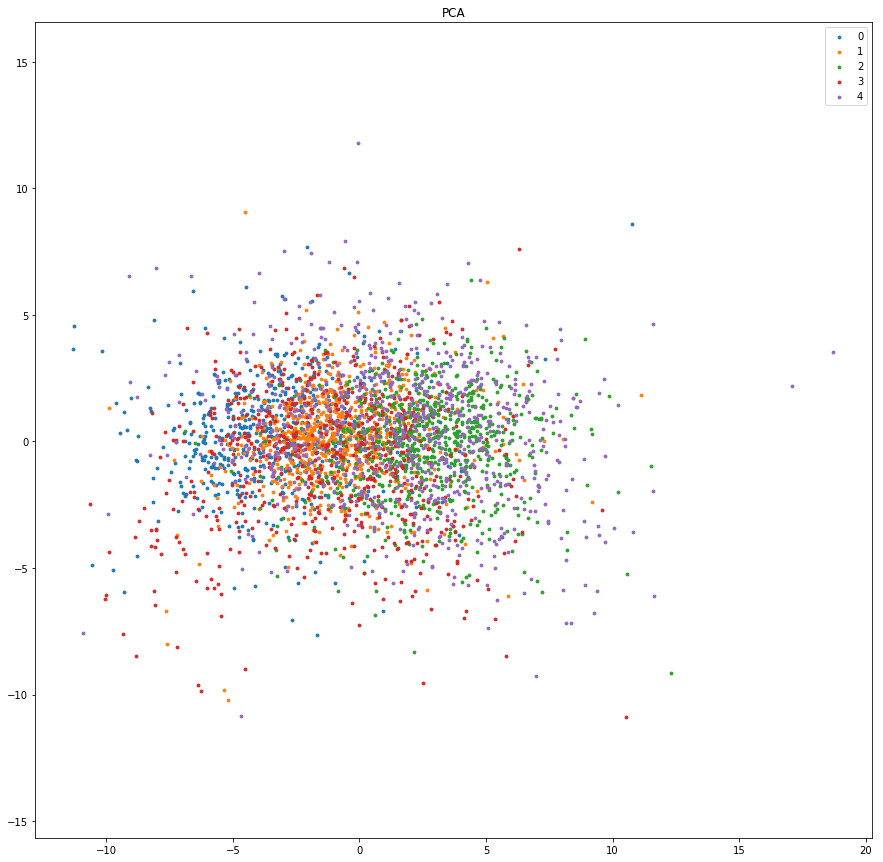

In [16]:
plot_embedding(PCA(), X_all, y_all)

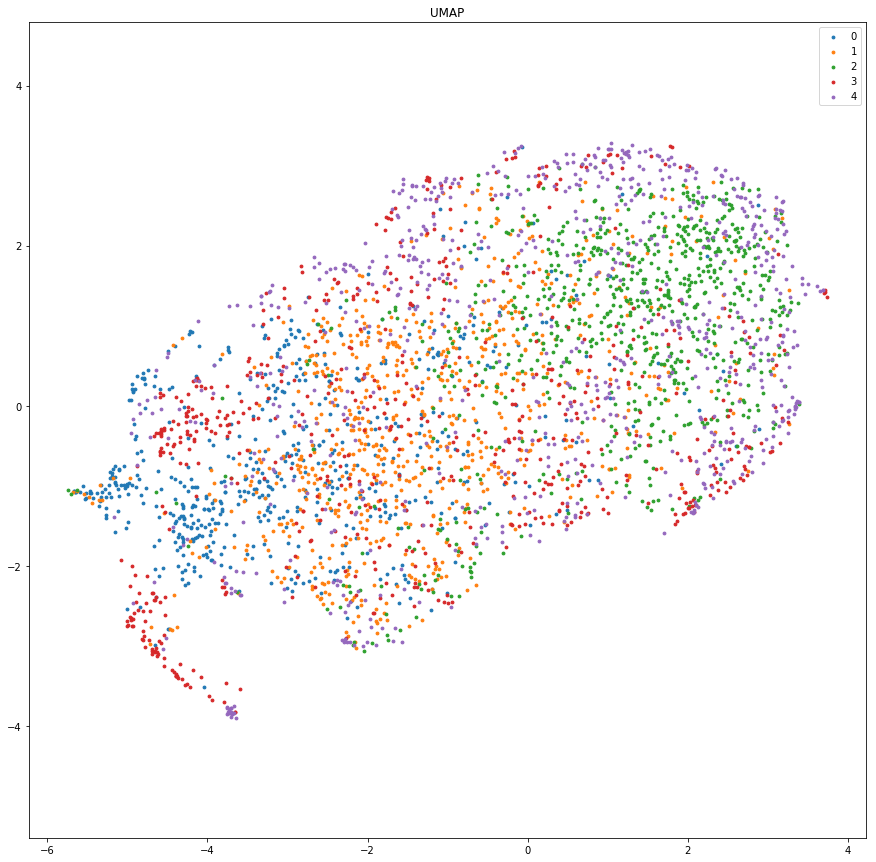

In [17]:
plot_embedding(UMAP(random_state=42), X_all, y_all)

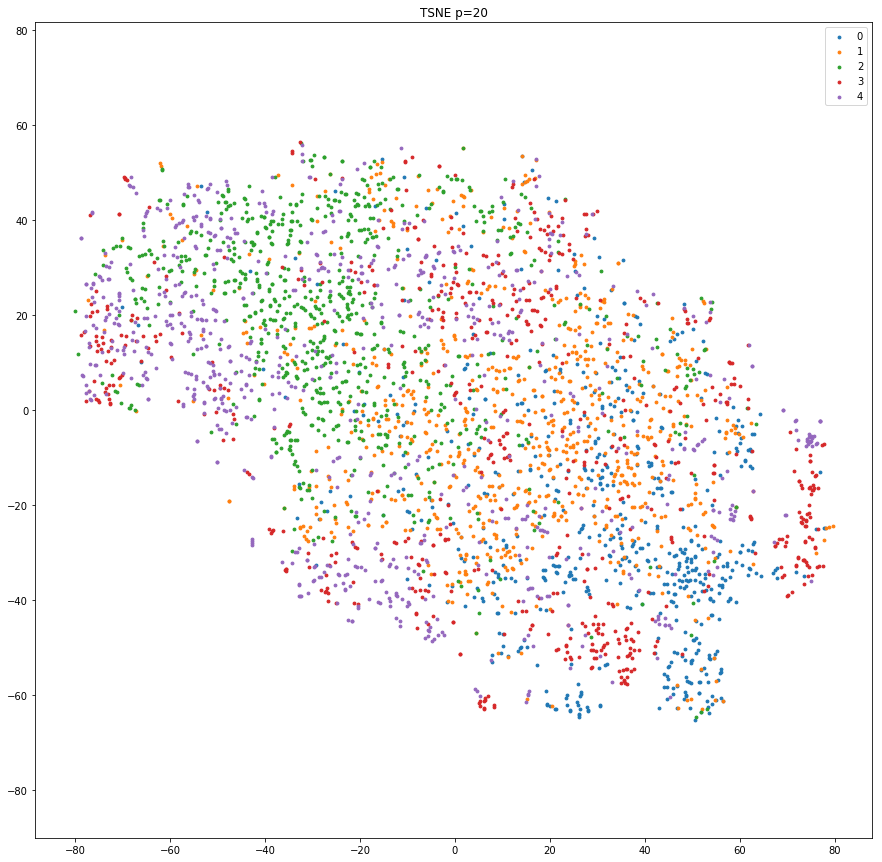

In [18]:
plot_embedding(TSNE(perplexity=20, random_state=42), X_all, y_all, title=' p=20')

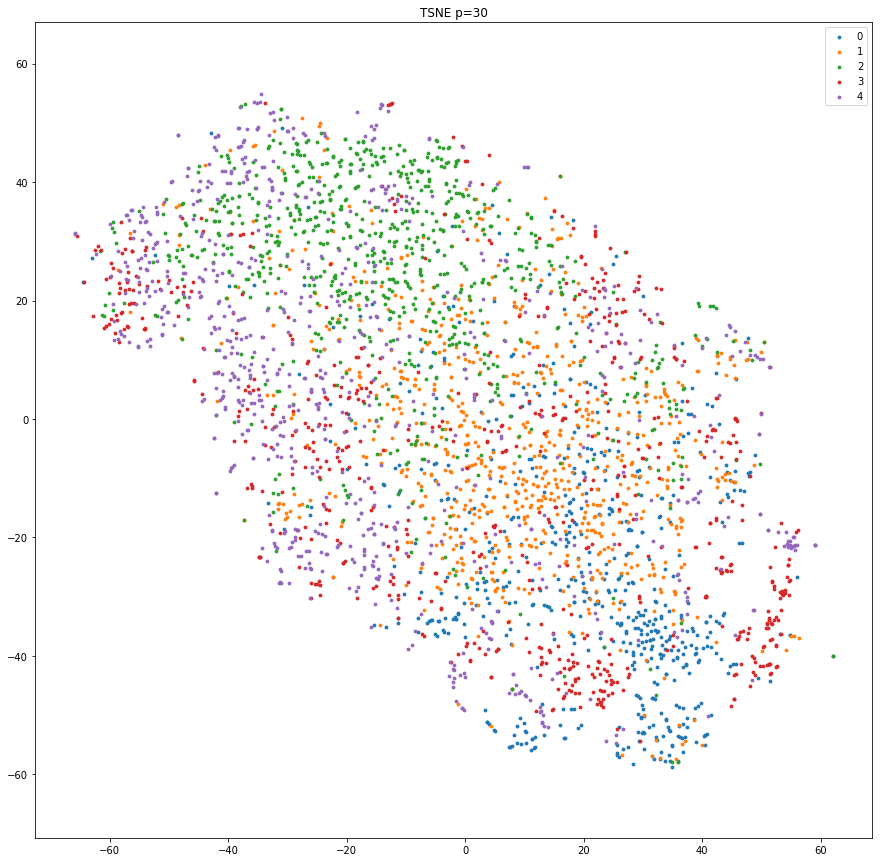

In [19]:
plot_embedding(TSNE(perplexity=30, random_state=42), X_all, y_all, title=' p=30')

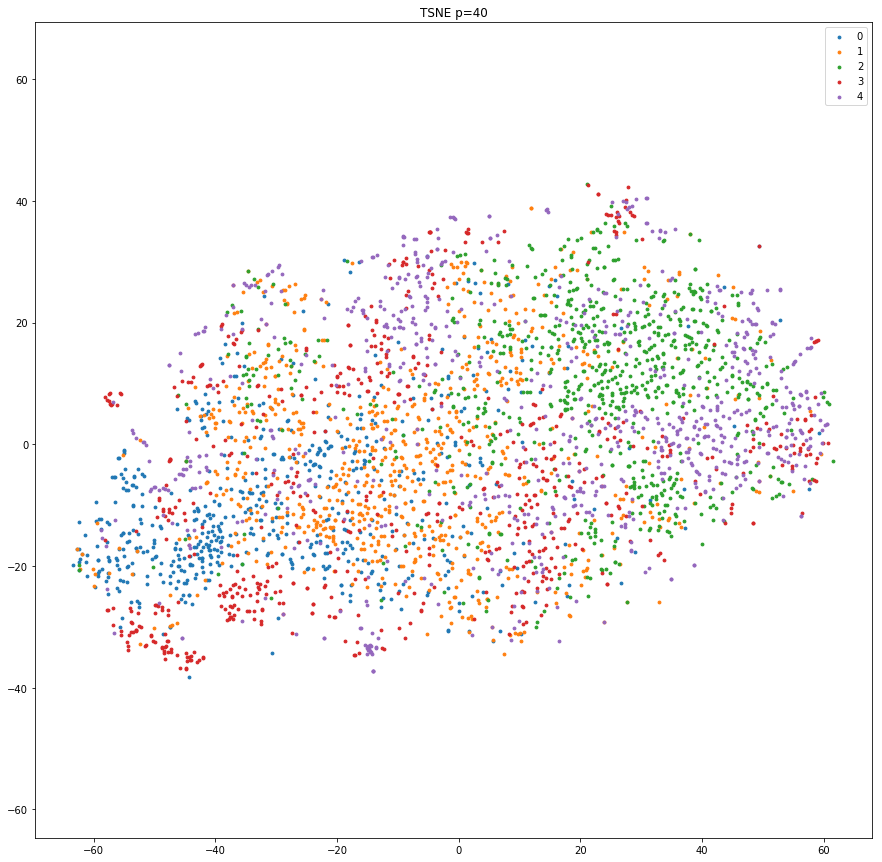

In [20]:
plot_embedding(TSNE(perplexity=40, random_state=42), X_all, y_all, title=' p=40')